In [1]:
options(repr.plot.width = 15, repr.plot.height = 15, repr.plot.res = 320)
options(jupyter.plot_mimetypes = "image/png")

In [2]:
suppressPackageStartupMessages({
    library("sf")
    library("dplyr")
    library("ggplot2")
    library("spatstat")
    library("stars")
    library("smacpod")
    library("tidyr")
    library("reshape2")
    library("nngeo")
    library("ggthemes")
    library("patchwork")
    library("colorspace")
})

# Load Data

In [3]:
crs <- st_crs(6427)
c(crs$input, crs$units)

[1] "EPSG:6427" "m"

In [4]:
denver_neighborhoods <- st_read("./data/denver_neighborhoods.shp")
# Remove DIA
denver_neighborhoods <- denver_neighborhoods %>%
    filter(NBHD_ID != 23)

Reading layer `denver_neighborhoods' from data source 
  `/Users/schmidmt/school/math6384/project/data/denver_neighborhoods.shp' 
  using driver `ESRI Shapefile'


Warning message in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, :
“GDAL Message 1: /Users/schmidmt/school/math6384/project/data/denver_neighborhoods.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.”


Simple feature collection with 78 features and 6 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -105.11 ymin: 39.61431 xmax: -104.5996 ymax: 39.91418
Geodetic CRS:  WGS 84


In [5]:
accidents <- st_read("data/traffic_accidents.gdb")

Reading layer `traffic_accidents' from data source 
  `/Users/schmidmt/school/math6384/project/data/traffic_accidents.gdb' 
  using driver `OpenFileGDB'
replacing null geometries with empty geometries
Simple feature collection with 97748 features and 45 fields (with 3220 geometries empty)
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -105.2062 ymin: 39.61441 xmax: -104.6097 ymax: 39.90431
Geodetic CRS:  WGS 84


In [6]:
tickets <- st_read("data/police_pedestrian_stops_and_vehicle_stops.gdb")

Reading layer `police_pedestrian_stops_and_vehicle_stops' from data source 
  `/Users/schmidmt/school/math6384/project/data/police_pedestrian_stops_and_vehicle_stops.gdb' 
  using driver `OpenFileGDB'
Simple feature collection with 1063691 features and 14 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -105.2179 ymin: 39.56308 xmax: -104.5833 ymax: 39.98556
Geodetic CRS:  WGS 84


# Initial Data Processing

## Remove Rows with missing geometries

In [7]:
accidents <- accidents[!st_is_empty(accidents), ]
accidents <- accidents[!(is.na(accidents$TU1_DRIVER_ACTION) | accidents$TU1_DRIVER_ACTION == ""), ]

## Filter For Common Dates

In [8]:
max_date <- min(max(accidents$REPORTED_DATE), max(tickets$TIME_PHONEPICKUP))
min_date <- max(min(accidents$REPORTED_DATE), min(tickets$TIME_PHONEPICKUP))

In [9]:
accidents <- accidents %>%
    filter(REPORTED_DATE >= min_date) %>%
    filter(REPORTED_DATE <= max_date)
tickets <- tickets %>%
    filter(TIME_PHONEPICKUP >= min_date) %>%
    filter(TIME_PHONEPICKUP <= max_date)

In [10]:
range(accidents$REPORTED_DATE)

[1] "2018-09-18 18:52:00 MDT" "2023-04-17 20:08:00 MDT"

## Remove Points Outside Denver

In [11]:
tickets <- tickets[lengths(st_intersects(tickets, denver_neighborhoods)) > 0, ]
accidents <- accidents[lengths(st_intersects(accidents, denver_neighborhoods)) > 0, ]

## Point Plots

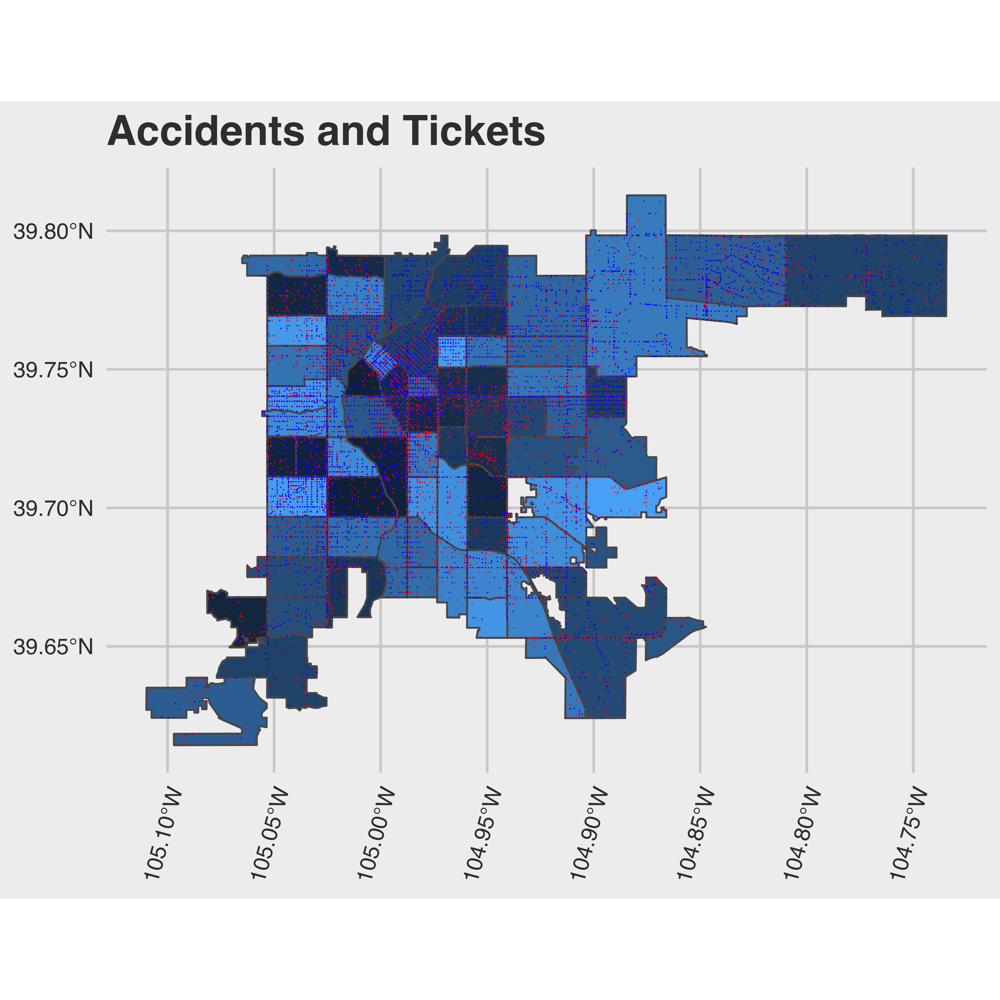

In [12]:
ggplot() +
    geom_sf(data = denver_neighborhoods, aes(fill = NBHD_ID), lwd = 1) +
    geom_sf(data = accidents %>% filter(between(REPORTED_DATE, as.Date("2021-01-01"), as.Date("2022-01-01"))), color = "Red", size = 0.01) +
    geom_sf(data = tickets %>% filter(between(TIME_PHONEPICKUP, as.Date("2021-01-01"), as.Date("2022-01-01"))), color = "Blue", size = 0.01) +
    theme_fivethirtyeight(base_size = 30) +
    theme(legend.position="none") +
    ggtitle("Accidents and Tickets") +
    theme(
        axis.text.x = element_text(angle=75, vjust=1, hjust=1),
        axis.title = element_text()
    )

In [13]:
head(accidents %>%
    filter(FATALITIES > 0 | SERIOUSLY_INJURED > 0) %>%
    filter(between(REPORTED_DATE, as.Date("2022-01-01"), as.Date("2023-01-01"))))

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



OBJECTID_1 INCIDENT_ID OFFENSE_ID      OFFENSE_CODE OFFENSE_CODE_EXTENSION
1 66608      2022100372  202210037254411 5441         1                     
2 66783      2022105851  202210585154410 5441         0                     
3 66794      2022106272  202210627254412 5441         2                     
4 66795      2022106336  202210633654410 5441         0                     
5 66839      2022108203  202210820354412 5441         2                     
6 66847      2022108649  202210864954410 5441         0                     
  TOP_TRAFFIC_ACCIDENT_OFFENSE   FIRST_OCCURRENCE_DATE LAST_OCCURRENCE_DATE
1 TRAF - ACCIDENT - SBI          2022-02-27 14:30:00   2022-02-27 14:30:00 
2 TRAF - ACCIDENT                2022-03-02 10:09:00   2022-03-02 10:09:00 
3 TRAF - ACCIDENT - FATAL        2022-03-02 15:20:00   2022-03-02 15:20:00 
4 TRAF - ACCIDENT                2022-03-02 16:09:00   2022-03-02 16:09:00 
5 TRAF - ACCIDENT - FATAL        2022-03-03 15:24:00   2022-03-03 15:24:00 
6 TRAF - ACCIDENT                2022-03-03 23:55:00   2022-03-03 23:55:00 
  REPORTED_DATE       INCIDENT_ADDRESS                         
1 2022-02-27 15:44:00 W EVANS AVE / S TEJON ST                 
2 2022-03-02 10:09:00 S BROADWAY LINCOLN ALY ST / E HARVARD AVE
3 2022-03-02 15:25:00 LEETSDALE DR / S MONACO ST               
4 2022-03-02 16:09:00 E ALAMEDA AVE / S QUEBEC ST              
5 2022-03-03 16:21:00 I25 HWYSB / W 8TH AVE                    
6 2022-03-03 23:58:00 N TOWER RD / E 56TH AVE                  
  SHAPE                      ⋯ TU2_DRIVER_ACTION     
1 POINT (-105.011 39.67865)  ⋯ No Contributing Action
2 POINT (-104.9869 39.67128) ⋯ Speeding              
3 POINT (-104.9128 39.7029)  ⋯ No Contributing Action
4 POINT (-104.9035 39.71128) ⋯                       
5 POINT (-105.0151 39.72932) ⋯ OTHER                 
6 POINT (-104.7721 39.7983)  ⋯ No Contributing Action
  TU2_DRIVER_HUMANCONTRIBFACTOR   TU2_PEDESTRIAN_ACTION SERIOUSLY_INJURED
1 Not Observed                                          1                
2 Not Observed                                          1                
3 No Apparent Contributing Factor                       0                
4                                                       1                
5 OTHER                           OTHER                 0                
6 No Apparent Contributing Factor                       1                
  FATALITIES FATALITY_MODE_1   FATALITY_MODE_2 SERIOUSLY_INJURED_MODE_1   
1 0                                            Motorcycle                 
2 0                                            Motorcycle                 
3 1          Motorcycle                                                   
4 0                                            SUV                        
5 1          PASSENGER CAR/VAN OTHER           OTHER                      
6 0                                            Passenger Car/Passenger Van
  SERIOUSLY_INJURED_MODE_2 SHAPE                     
1                          POINT (-105.011 39.67865) 
2                          POINT (-104.9869 39.67128)
3                          POINT (-104.9128 39.7029) 
4                          POINT (-104.9035 39.71128)
5 OTHER                    POINT (-105.0151 39.72932)
6                          POINT (-104.7721 39.7983)

## Tickets and Accidents over time


In [14]:
st_drop_geometry(accidents) %>%
    filter(FATALITIES > 0) %>%
    mutate(count = FATALITIES, ) %>%
    mutate(date = cut(REPORTED_DATE, "1 year")) %>%
    group_by(date) %>%
    dplyr::summarise(fatalitles = sum(count))

date,fatalitles
<fct>,<int>
2018-01-01,16
2019-01-01,57
2020-01-01,52
2021-01-01,69
2022-01-01,51
2023-01-01,10


In [15]:
accident_count_by_month <- st_drop_geometry(accidents) %>%
    filter(FATALITIES > 0 | SERIOUSLY_INJURED > 0) %>%
    mutate(count = 1, ) %>%
    mutate(date = cut(REPORTED_DATE, "1 month")) %>%
    group_by(date) %>%
    dplyr::summarise(accidents = sum(count)) %>%
    arrange(date)

In [16]:
ticket_count_by_month <- st_drop_geometry(tickets) %>%
    mutate(count = 1, ) %>%
    mutate(date = cut(TIME_PHONEPICKUP, "1 month")) %>%
    group_by(date) %>%
    dplyr::summarise(tickets = sum(count)) %>%
    arrange(date)

In [17]:
monthly_counts <- inner_join(accident_count_by_month, ticket_count_by_month, by = "date") %>% arrange(date)

monthly_relatives <- monthly_counts %>% mutate(
    accidents = 100 * accidents / first(monthly_counts)$accidents,
    tickets = 100 * tickets / first(monthly_counts)$tickets,
)

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


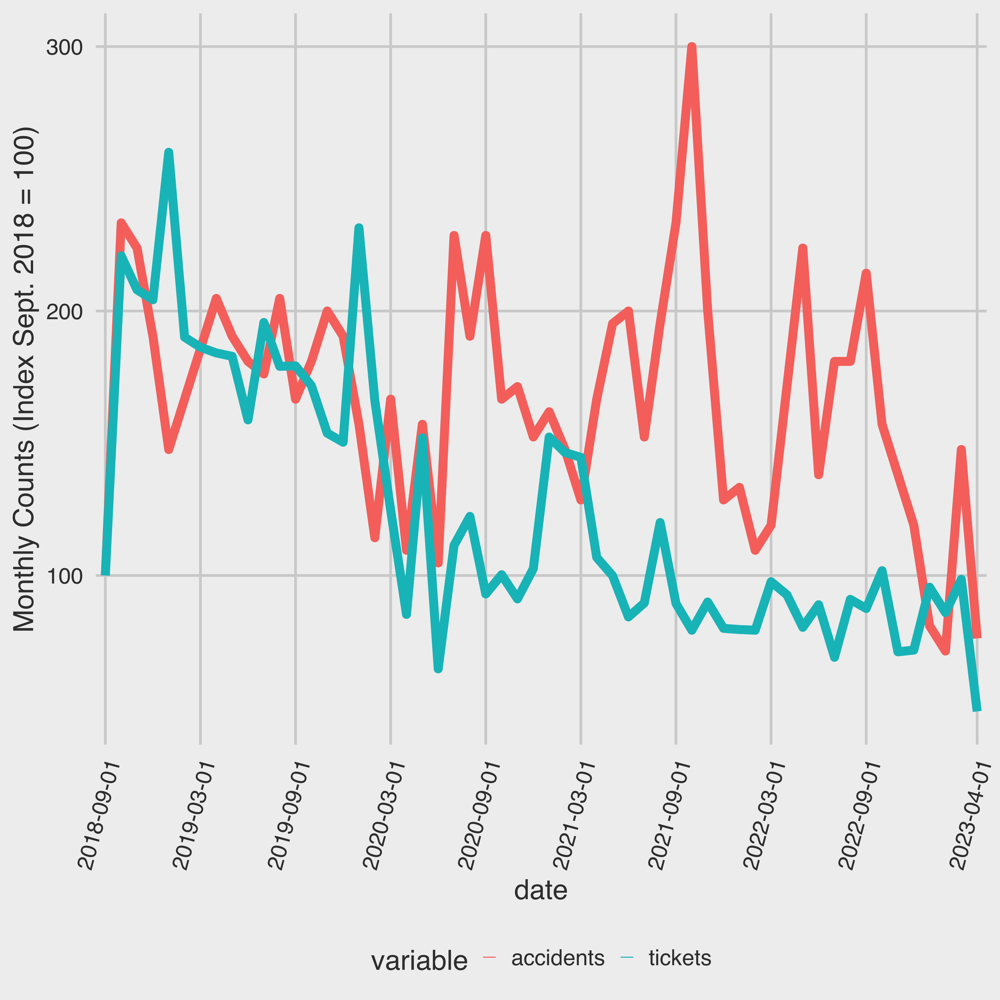

In [18]:
ggplot(data = melt(monthly_relatives, id.vars="date")) +
    geom_line(aes(x = date, y = value, color = variable, group=variable, size=1)) +
    scale_size_continuous(guide = "none") +
    scale_x_discrete(breaks = levels(monthly_counts$date)[seq(1, nlevels(monthly_counts$date), length.out = 10)]) +
    theme_fivethirtyeight(base_size = 30) +
    theme(
        axis.text.x = element_text(angle=75, vjust=1, hjust=1),
        axis.title = element_text()
    ) +
    ylab("Monthly Counts (Index Sept. 2018 = 100)")

In [19]:
accident_types_over_time <- st_drop_geometry(accidents) %>%
    mutate(count = 1) %>%
    mutate(date = cut(REPORTED_DATE, "1 month")) %>%
    group_by(date, TU1_DRIVER_ACTION) %>%
    count() %>%
    pivot_wider(names_from = TU1_DRIVER_ACTION, values_from = n, values_fill = 0) %>%
    arrange(date)

Warning message:
“Transformation introduced infinite values in continuous y-axis”


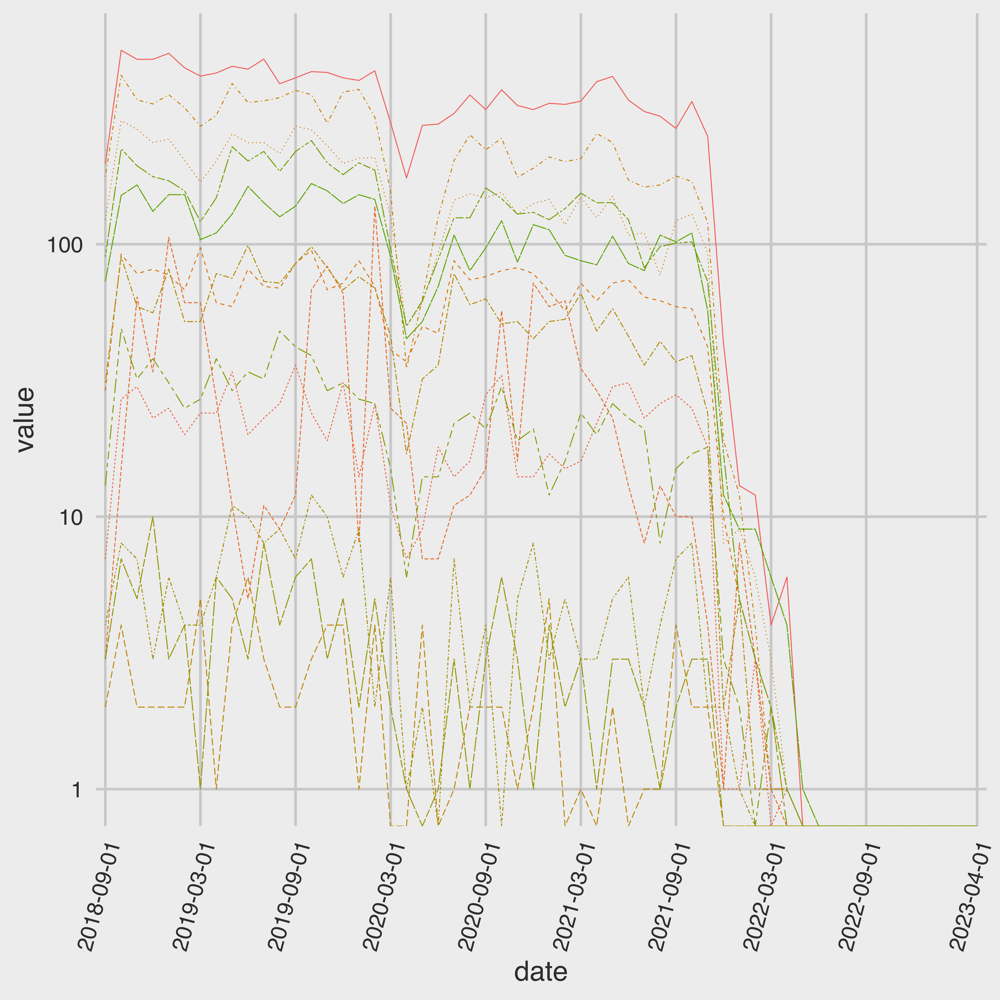

In [20]:
ggplot() +
    geom_line(
        data = melt(accident_types_over_time, id.vars = "date"),
            aes(x = date, y = value, group = variable, color = variable, linetype = variable)
    ) + 
    scale_y_continuous(trans = "log10") +
    scale_x_discrete(breaks = levels(monthly_counts$date)[seq(1, nlevels(monthly_counts$date), length.out = 10)]) +
    theme_fivethirtyeight(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text.x = element_text(angle=75, vjust=1, hjust=1),
        axis.title = element_text()
    ) 

## Filter To Keep Points From 2022

accidents <- accidents %>%
    filter(between(REPORTED_DATE, as.Date("2022-01-01"), as.Date("2023-01-01")))
tickets <- tickets %>%
    filter(between(TIME_PHONEPICKUP, as.Date("2022-01-01"), as.Date("2023-01-01")))

## Keep Only Accidents with Fatalitles or Serious Injuries

In [21]:
accidents <- accidents  %>%
    filter(FATALITIES > 0 | SERIOUSLY_INJURED > 0)

# Analysis

## Define Boundary and Create PPP

In [22]:
boundary <- as.owin(st_transform(st_remove_holes(st_union(st_geometry(denver_neighborhoods)), max_area = 50000), crs))

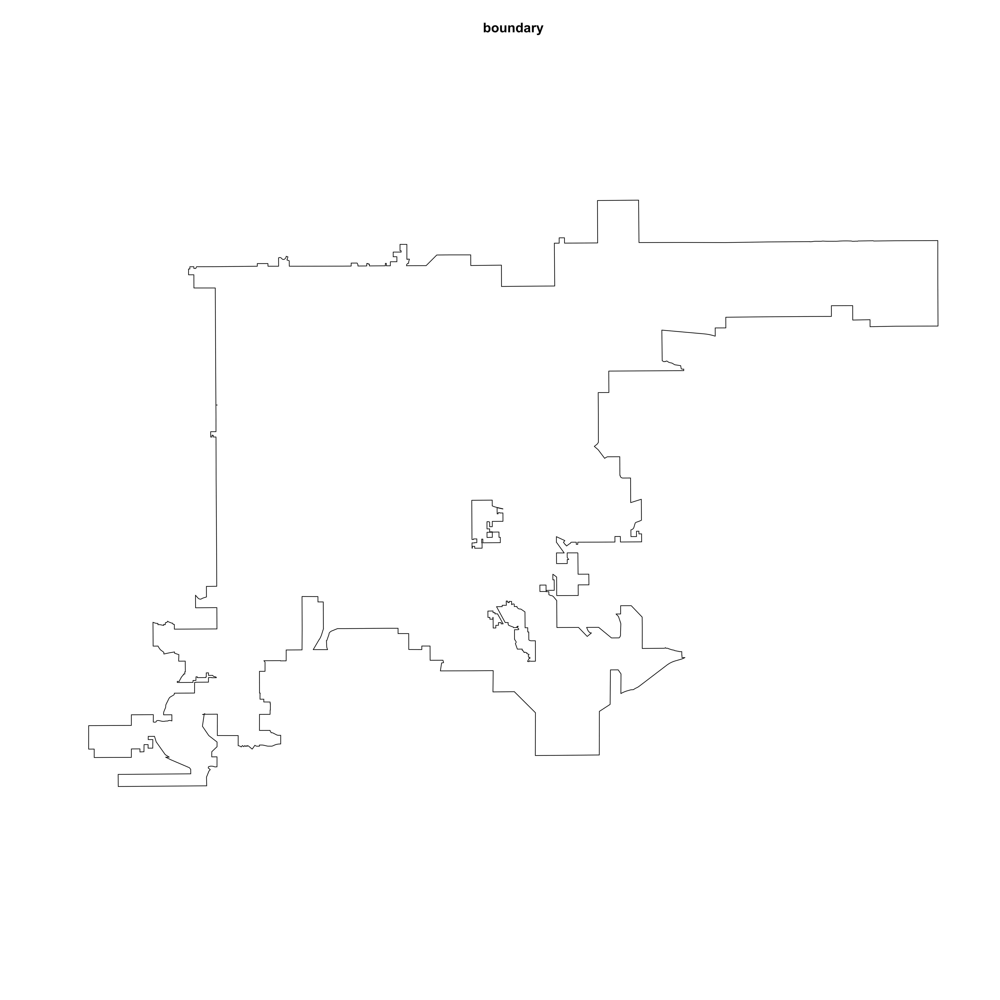

In [23]:
plot(boundary)

In [24]:
tickets_ppp <- as.ppp(st_transform(st_geometry(tickets), crs), W = boundary)
accidents_ppp <- as.ppp(st_transform(st_geometry(accidents), crs), W = boundary)

Warning message:
“data contain duplicated points”
Warning message:
“data contain duplicated points”


## Density Estimation

In [25]:
# Use Scott's Rule to determine the Bandwidths in each direction for each point set.

tickets_bandwidth <- c(sd(tickets_ppp$x) * length(tickets_ppp)^(-1/(2 + 4)), sd(tickets_ppp$y) * length(tickets_ppp)^(-1/(2 +
    4))) /5
accidents_bandwidth <- c(sd(accidents_ppp$x) * length(accidents_ppp)^(-1/(2 + 4)), sd(accidents_ppp$y) *
    length(accidents_ppp)^(-1/(2 + 4))) / 5

In [26]:
tickets_density <- density.ppp(tickets_ppp, sigma = tickets_bandwidth)
accidents_density <- density.ppp(accidents_ppp, sigma = accidents_bandwidth)

In [27]:
ticket_density_plot <- ggplot() +
    geom_sf(
        data = st_as_sf(stars::st_as_stars(tickets_density)) %>% st_set_crs(crs),
        aes(fill = v),
        col = NA
    ) +
    scale_fill_viridis_c() +
    geom_sf(data = st_boundary(denver_neighborhoods)) +
    theme_fivethirtyeight(base_size = 30) +
    theme(
        legend.position = "right",
        axis.text.x = element_text(angle=75, vjust=1, hjust=1),
        axis.title = element_text()
    ) +
    guides(
        size = "none",
        colour = guide_colourbar(title.position = "right")
    ) +
    theme(
        legend.key.height = unit(2.5, "cm"),
        legend.title = element_text(size = 12, angle = 90),
        legend.title.align = 0.5,
        legend.direction = "vertical"
    ) +
    ggtitle("Estimate of Ticket Density")

In [28]:
accident_density_plot <- ggplot() + 
    geom_sf(
        data = st_as_sf(stars::st_as_stars(accidents_density)) %>% st_set_crs(crs),
        aes(fill = v),
        col = NA
    ) +
    scale_fill_viridis_c() +
    geom_sf(data = st_boundary(denver_neighborhoods)) +
    theme_fivethirtyeight(base_size = 30) +
    theme(
        legend.position = "right",
        axis.text.x = element_text(angle=75, vjust=1, hjust=1),
        axis.title = element_text()
    ) +
    guides(
        size = "none",
        colour = guide_colourbar(title.position = "right")
    )+
    theme(
        legend.key.height = unit(1.5, "cm"),
        legend.title = element_text(size = 12, angle = 90),
        legend.title.align = 0.5,
        legend.direction = "vertical"
    ) +
    ggtitle("Estimate of Serious Accident Density")

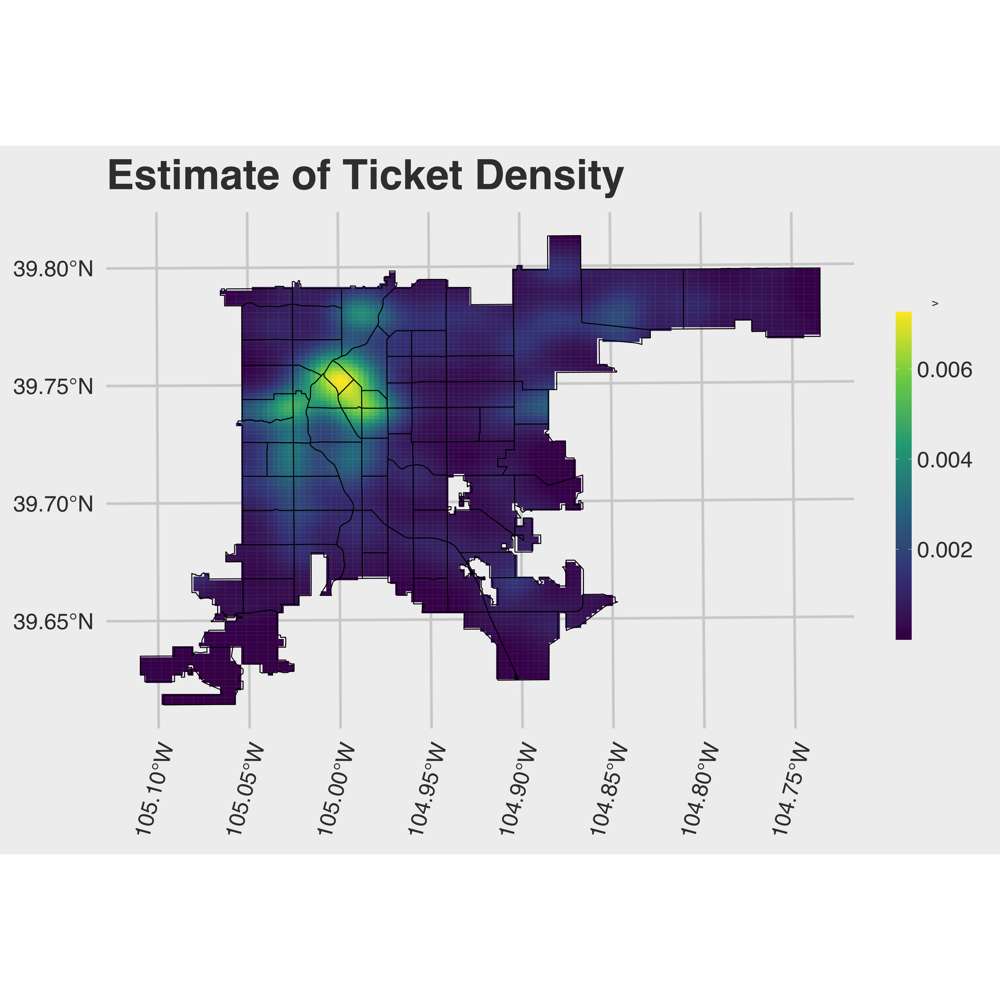

In [29]:
ticket_density_plot

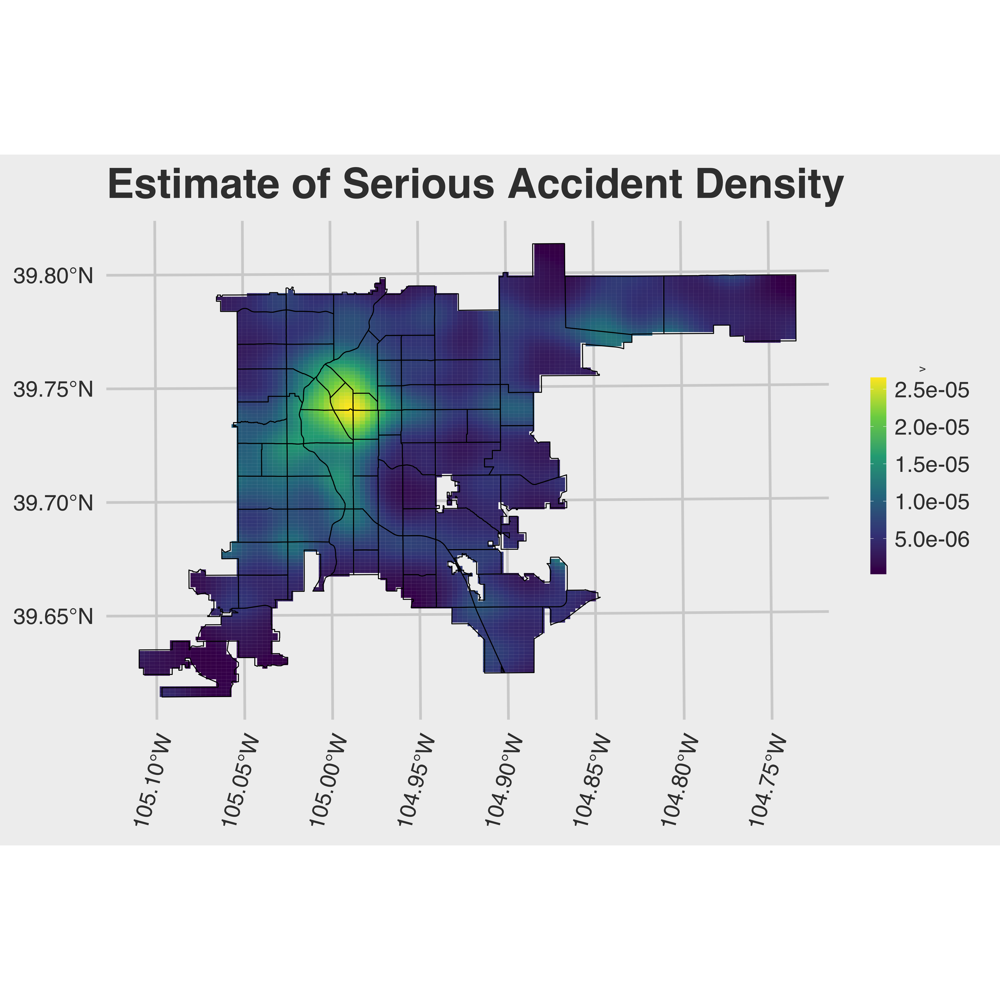

In [30]:
accident_density_plot

## L Function

In [31]:
accidents_lest <- spatstat.explore::Lest(accidents_ppp, correction = "Ripley")

e_outer = envelope(
    accidents_ppp,
    fun = spatstat.explore::Lest,
    nsim=499,
    rand=1,
    save_patterns = TRUE,
    correction = "Ripley"
)
e_tol = envelope(
    accidents_ppp,
    fun = spatstat.explore::Lest,
    nsim=499,
    rand=floor((1-0.95) * (499 + 1) / 2),
    save_patterns = TRUE,
    correction = "Ripley"
)

In [ ]:
ggplot() + geom_line(data = accidents_lest, aes(x = r, y = iso - r)) + theme_linedraw()

## Log Relative Risk

In [32]:
nrow(tickets)

[1] 327814

In [33]:
nrow(accidents)

[1] 1966

In [35]:
combined <- st_sf(
    kind = c(
        rep("ticket", each = nrow(tickets)),
        rep("accident", each = nrow(accidents))
    ),
    c(
        st_geometry(tickets),
        st_geometry(accidents)
    )
)

In [36]:
#combined_subsample <- combined %>%
#    group_by(kind) %>%
#    sample_frac(0.1) %>%
#    ungroup

In [37]:
combined_subsample <- st_sf(
    kind = c(
        rep("ticket", each = 2500),
        rep("accident", each = nrow(accidents))
    ),
    c(
        st_geometry(tickets %>% sample_n(2500)),
        st_geometry(accidents)
    )
)

In [38]:
combined_ppp <- ppp(
    x = st_coordinates(st_geometry(st_transform(combined, crs)))[, "X"],
    y = st_coordinates(st_geometry(st_transform(combined, crs)))[, "Y"],
    window = boundary,
    marks = combined$kind,
)

combined_subsample_ppp <- ppp(
    x = st_coordinates(st_geometry(st_transform(combined_subsample, crs)))[, "X"],
    y = st_coordinates(st_geometry(st_transform(combined_subsample, crs)))[, "Y"],
    window = boundary,
    marks = combined_subsample$kind
) 

Warning message:
“data contain duplicated points”
Warning message:
“data contain duplicated points”


In [39]:
combined_rr <- logrr(combined_ppp, case = "accident", diggle = TRUE, sigma=1500)

converting marks(x) to a factor

accident has been selected as the case group



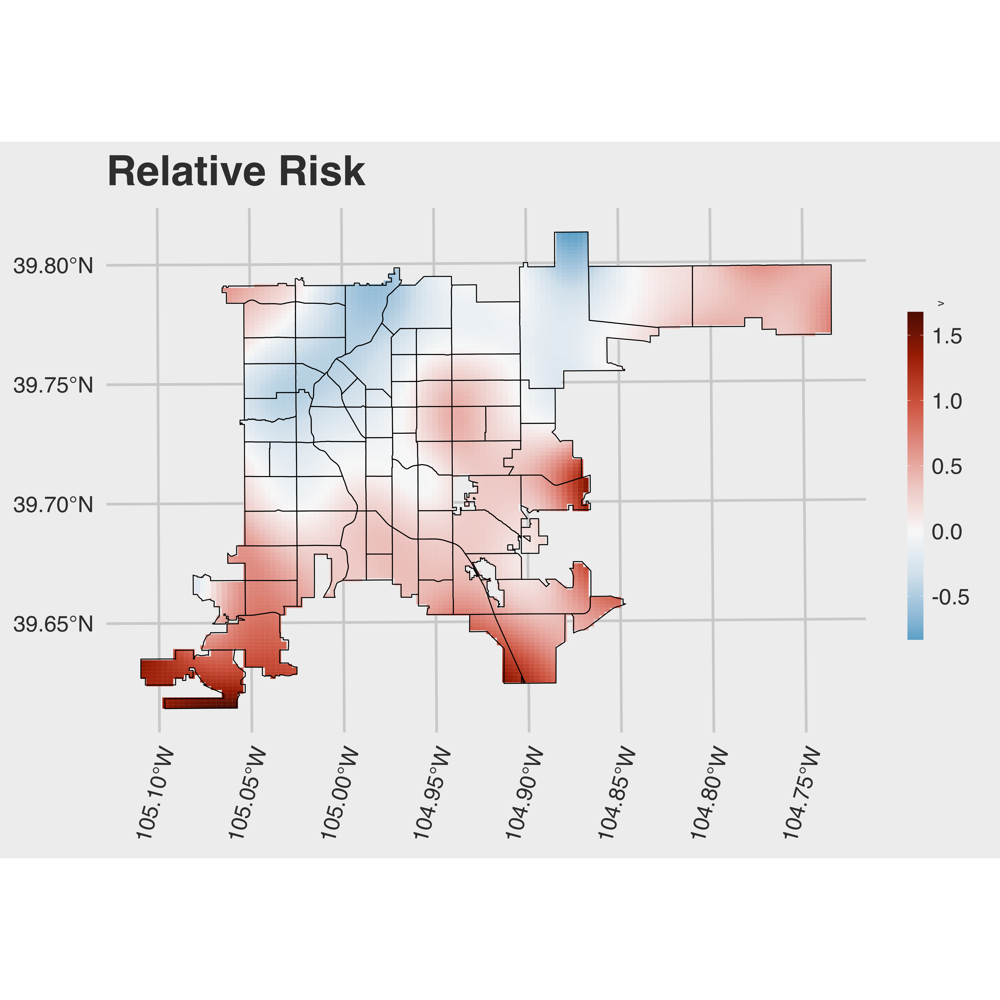

In [40]:
ggplot() + 
    geom_sf(
        data = st_as_sf(stars::st_as_stars(combined_rr)) %>% st_set_crs(crs),
        aes(fill = v),
        col = NA
    ) +
    scale_fill_continuous_divergingx(palette="RdBu", mid=0.0, rev=TRUE) +
    geom_sf(data = st_boundary(denver_neighborhoods)) +
    labs(title = "Relative Risk") +
    theme_fivethirtyeight(base_size = 30) +
    theme(
        legend.position = "right",
        axis.text.x = element_text(angle=75, vjust=1, hjust=1),
        axis.title = element_text()
    ) +
    guides(
        size = "none",
        colour = guide_colourbar(title.position = "right")
    ) +
    theme(
        legend.key.height = unit(2.5, "cm"),
        legend.title = element_text(size = 12, angle = 90),
        legend.title.align = 0.5,
        legend.direction = "vertical"
    )

## Difference of K Functions

In [ ]:
kd <- kdest(combined_subsample_ppp, case = "accident")

In [ ]:
plot(kd, cbind(iso, theo) ~ r)

In [ ]:
kd_mc <- kdest(combined_subsample_ppp, case = "accident", nsim = 499, level = 0.95, r = seq(0, 5000,
    len = 201))

In [ ]:
plot(kd_mc)

In [ ]:
summary(kd_mc)

## Local Rates

In [42]:
length(combined_subsample_ppp)

[1] 6

In [41]:
scan = spscan.test(combined_subsample_ppp, case = "accident", nsim=127, alpha = 0.2, cl=10)

converting marks(x) to a factor

accident has been selected as the case group



In [43]:
summary(scan)

centroid_x,centroid_y,radius,events,cases,ex,rr,stat,p
<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
965332.8,505386.2,13996.2,2349,1170,1034.1,1.3,33.8,0.008
956019.8,516772.1,163.0,22,21,9.7,2.2,13.8,0.023
976740.6,523184.8,808.1,15,15,6.6,2.3,12.3,0.031
972714.8,520488.8,815.0,14,14,6.2,2.3,11.5,0.078
966069.8,520896.9,699.1,25,22,11.0,2.0,10.7,0.109


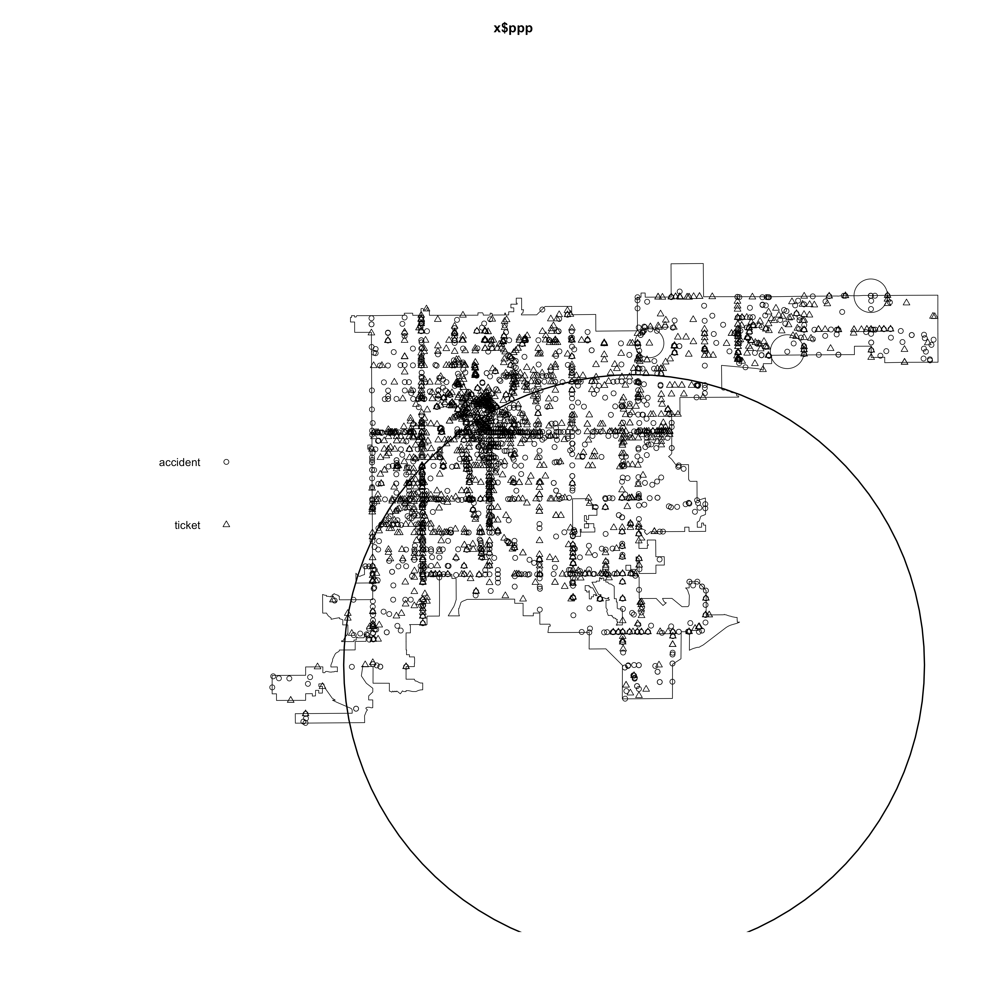

In [44]:
plot(scan)

In [46]:
qnn_res <- qnn.test(combined_subsample_ppp, q=c(3, 5, 7, 9, 11, 13, 15), nsim=499, case="accident")

converting marks(x) to a factor

accident has been selected as the case group



Q nearest neighbors test

case label:  accident 
control label:  ticket 

Summary of observed test statistics

  q    Tq pvalue
  3  3699  0.002
  5  5746  0.002
  7  7775  0.002
  9  9789  0.002
 11 11687  0.002
 13 13645  0.002
 15 15514  0.002

Summary of observed contrasts between test statistics

  contrast Tcontrast pvalue
   T5 - T3      2047  0.002
   T7 - T3      4076  0.002
   T9 - T3      6090  0.002
  T11 - T3      7988  0.002
  T13 - T3      9946  0.002
  T15 - T3     11815  0.002
   T7 - T5      2029  0.002
   T9 - T5      4043  0.002
  T11 - T5      5941  0.002
  T13 - T5      7899  0.002
  T15 - T5      9768  0.002
   T9 - T7      2014  0.002
  T11 - T7      3912  0.002
  T13 - T7      5870  0.002
  T15 - T7      7739  0.002
  T11 - T9      1898  0.002
  T13 - T9      3856  0.002
  T15 - T9      5725  0.002
 T13 - T11      1958  0.002
 T15 - T11      3827  0.002
 T15 - T13      1869  0.004
